# MMDetection (training custom dataset)

In [1]:
!nvcc --version
!gcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
Copyright (C) 2021 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [2]:
# install dependencies:
# Using older versions of torch and torchvision, as well as cuda 12.1 because of the compatibility
!pip install -U torch==2.1.0+cu121 torchvision==0.16.0+cu121 -f https://download.pytorch.org/whl/torch_stable.html

# install mmcv thus we could use CUDA operators
!pip install mmcv==2.1.0 -f https://download.openmmlab.com/mmcv/dist/cu121/torch2.1/index.html

# Install mmdetection
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
# !git clone https://github.com/open-mmlab/mmdetection.git -b v2.25.0
%cd mmdetection

!pip install -e .

!pip install -U openmim

Looking in links: https://download.pytorch.org/whl/torch_stable.html
Looking in links: https://download.openmmlab.com/mmcv/dist/cu121/torch2.1/index.html
Cloning into 'mmdetection'...
remote: Enumerating objects: 38019, done.
remote: Counting objects: 100% (102/102), done.
remote: Compressing objects: 100% (75/75), done.
remote: Total 38019 (delta 39), reused 61 (delta 25), pack-reused 37917
Receiving objects: 100% (38019/38019), 63.24 MiB | 29.46 MiB/s, done.
Resolving deltas: 100% (26205/26205), done.
/content/mmdetection
Obtaining file:///content/mmdetection
  Preparing metadata (setup.py) ... done
  Running setup.py develop for mmdet


In [3]:
# Check Pytorch installation
import torch, torchvision
print("torch version:",torch.__version__, "cuda:",torch.cuda.is_available())

# Check MMDetection installation
import mmdet
print("mmdetection:",mmdet.__version__)

# Check mmcv installation
import mmcv
print("mmcv:",mmcv.__version__)

# Check mmengine installation
import mmengine
print("mmengine:",mmengine.__version__)


torch version: 2.1.0+cu121 cuda: True
mmdetection: 3.3.0
mmcv: 2.1.0
mmengine: 0.10.4


In [4]:
%%bash
# Check nvcc version
nvcc -V
echo
# Check GCC version
gcc --version
echo
# Check the version of torch and cuda packages
pip list | grep "torch\|cuda"

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0

gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
Copyright (C) 2021 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.


cupy-cuda12x                     12.2.0
jaxlib                           0.4.26+cuda12.cudnn89
torch                            2.1.0+cu121
torchaudio                       2.2.1+cu121
torchdata                        0.7.1
torchsummary                     1.5.1
torchtext                        0.17.1
torchvision                      0.16.0+cu121


In [5]:
# Google Drive setup
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


## Imports

In [6]:
import skimage
import random
from pathlib import Path
from datetime import datetime
from tqdm import tqdm
import requests
import sys
import json
import numpy as np
import os

### Methods


In [7]:
def unzip(input_file:Path, output_dir=None):
    from zipfile import ZipFile
    with ZipFile(input_file,"r") as zip_ref:
         for file in tqdm(iterable=zip_ref.namelist(), total=len(zip_ref.namelist())):
              zip_ref.extract(member=file, path=output_dir)

def classes_from_coco(annotation_file:Path):
    with open(annotation_file) as f:
        ann = json.load(f)
    _, cfg_classes = zip(*sorted([(cat["id"], cat["name"]) for cat in ann["categories"]]))
    return cfg_classes

def mywget(url, fname, force=False):
    fname = Path(fname)
    if fname.exists() and ~force:
        print(f"File already exists. Use force=True to owerwrite.")
        return
    fname.parent.mkdir(parents=True, exist_ok=True)

    response = requests.get(url, stream=True)
    total_size_in_bytes= int(response.headers.get('content-length', 0))
    block_size = 1024 #1 Kibibyte
    progress_bar = tqdm(total=total_size_in_bytes, unit='iB', unit_scale=True)
    with open(fname, 'wb') as file:
        for data in response.iter_content(block_size):
            progress_bar.update(len(data))
            file.write(data)
    progress_bar.close()
    if total_size_in_bytes != 0 and progress_bar.n != total_size_in_bytes:
        print("ERROR, something went wrong")

In [8]:
print(mmdet.__version__)
print(mmdet.__file__) # path where mmdetection is saved - use it in Jupyter notebook terminal

3.3.0
/content/mmdetection/mmdet/__init__.py


## Data preparation

In [9]:
from pycocotools.coco import COCO

# Path to load the COCO annotation file
annotation_file = '/content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/trainval.json'

# Initialise the COCO object
coco = COCO(annotation_file)

# Get all category tags and corresponding category IDs
categories = coco.loadCats(coco.getCatIds())
category_id_to_name = {cat['id']: cat['name'] for cat in categories}

# Print all category IDs and corresponding category names
for category_id, category_name in category_id_to_name.items():
    print(f"Category ID: {category_id}, Category Name: {category_name}")

loading annotations into memory...
Done (t=0.88s)
creating index...
index created!
Category ID: 1, Category Name: cell nucleus


## Spliting dataset

In [10]:
data_root = Path("/content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei")

In [11]:
# import sys
sys.path.append('/content/gdrive/MyDrive/cell_nuclei_data/')
print(sys.path)

['/content', '/env/python', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '', '/usr/local/lib/python3.10/dist-packages', '/content/mmdetection', '/usr/lib/python3/dist-packages', '/usr/local/lib/python3.10/dist-packages/IPython/extensions', '/root/.ipython', '/content/gdrive/MyDrive/cell_nuclei_data/']


In [12]:
import coco_dataset_custom
# import json

fnin = data_root / 'trainval.json'

fn1 = data_root / 'train.json'
fn2 = data_root / 'test.json'
fn3 = data_root / 'val.json'
fntmp = data_root / 'tmp.json'

assert fnin.exists()

# Split the original dataset into two parts
ccd = coco_dataset_custom.CocoDataset(fnin, data_root / "images")
ccd.train_test_split(fn1, fntmp, test_size=0.2)

# Split the second part into validation and test sets
ccd = coco_dataset_custom.CocoDataset(fntmp, data_root / "images")
ccd.train_test_split(fn2, fn3, test_size=0.5)

# Verify that the validation set file exists
assert fn3.exists()

# Optional: Load and display the content
with open(fn1, 'r') as f:
    train_data = json.load(f)

with open(fn2, 'r') as f:
    test_data = json.load(f)

with open(fn3, 'r') as f:
    val_data = json.load(f)

with open(fnin, 'r') as f:
    trainval_data = json.load(f)


In [12]:
len(train_data['images'])
# len(test_data['images'])

80

In [14]:
!pwd

/content/mmdetection


In [24]:
from mmengine import Config
# mask_rcnn_model_name = "mask-rcnn_r50-caffe_fpn_ms-poly-3x_coco"
mask_rcnn_model_name = "mask-rcnn_r101-caffe_fpn_1x_coco"
# mask_rcnn_model_name = "mask-rcnn_r50_fpn_ms-poly-3x_coco"

cfg = Config.fromfile('./configs/mask_rcnn/' + mask_rcnn_model_name + '.py')
print(cfg.pretty_text)

auto_scale_lr = dict(base_batch_size=16, enable=False)
backend_args = None
data_root = 'data/coco/'
dataset_type = 'CocoDataset'
default_hooks = dict(
    checkpoint=dict(interval=1, type='CheckpointHook'),
    logger=dict(interval=50, type='LoggerHook'),
    param_scheduler=dict(type='ParamSchedulerHook'),
    sampler_seed=dict(type='DistSamplerSeedHook'),
    timer=dict(type='IterTimerHook'),
    visualization=dict(type='DetVisualizationHook'))
default_scope = 'mmdet'
env_cfg = dict(
    cudnn_benchmark=False,
    dist_cfg=dict(backend='nccl'),
    mp_cfg=dict(mp_start_method='fork', opencv_num_threads=0))
load_from = None
log_level = 'INFO'
log_processor = dict(by_epoch=True, type='LogProcessor', window_size=50)
model = dict(
    backbone=dict(
        depth=101,
        frozen_stages=1,
        init_cfg=dict(
            checkpoint='open-mmlab://detectron2/resnet101_caffe',
            type='Pretrained'),
        norm_cfg=dict(requires_grad=False, type='BN'),
        norm_eval=True

## Getting pretrained weights

You need to copy .pth file.

In [25]:
import yaml
metafile_path = "./configs/mask_rcnn/metafile.yml"

# Open the YAML file in read mode
with open(metafile_path, 'r') as file:

    # Load the YAML data into a dictionary using safe_load
    data_dict = yaml.safe_load(file)

# print(data_dict["Models"])
model_data = {}
for model in data_dict["Models"]:
  # print(model)
  model_config = model["Config"]
  if os.path.basename(model_config) == mask_rcnn_model_name + ".py":
    model_data = model
    break
print(model_data)
weights_url = model_data["Weights"]
print(weights_url)
weights_filename = os.path.basename(weights_url)
print(weights_filename)

{'Name': 'mask-rcnn_r101-caffe_fpn_1x_coco', 'In Collection': 'Mask R-CNN', 'Config': 'configs/mask_rcnn/mask-rcnn_r101-caffe_fpn_1x_coco.py', 'Metadata': {'Epochs': 12}, 'Results': [{'Task': 'Object Detection', 'Dataset': 'COCO', 'Metrics': {'box AP': 40.4}}, {'Task': 'Instance Segmentation', 'Dataset': 'COCO', 'Metrics': {'mask AP': 36.4}}], 'Weights': 'https://download.openmmlab.com/mmdetection/v2.0/mask_rcnn/mask_rcnn_r101_caffe_fpn_1x_coco/mask_rcnn_r101_caffe_fpn_1x_coco_20200601_095758-805e06c1.pth'}
https://download.openmmlab.com/mmdetection/v2.0/mask_rcnn/mask_rcnn_r101_caffe_fpn_1x_coco/mask_rcnn_r101_caffe_fpn_1x_coco_20200601_095758-805e06c1.pth
mask_rcnn_r101_caffe_fpn_1x_coco_20200601_095758-805e06c1.pth


In [17]:
!pwd

/content/mmdetection


In [26]:
!mkdir checkpoints
!wget {weights_url} -O ./checkpoints/{weights_filename}

mkdir: cannot create directory ‘checkpoints’: File exists
--2024-04-30 10:51:26--  https://download.openmmlab.com/mmdetection/v2.0/mask_rcnn/mask_rcnn_r101_caffe_fpn_1x_coco/mask_rcnn_r101_caffe_fpn_1x_coco_20200601_095758-805e06c1.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 8.45.176.234, 8.45.176.203, 8.45.176.233, ...
Connecting to download.openmmlab.com (download.openmmlab.com)|8.45.176.234|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 254092708 (242M) [application/octet-stream]
Saving to: ‘./checkpoints/mask_rcnn_r101_caffe_fpn_1x_coco_20200601_095758-805e06c1.pth’

./checkpoints/mask_ 100%[===================>] 242.32M  48.9MB/s    in 6.3s    

2024-04-30 10:51:34 (38.5 MB/s) - ‘./checkpoints/mask_rcnn_r101_caffe_fpn_1x_coco_20200601_095758-805e06c1.pth’ saved [254092708/254092708]



In [ ]:
# !mim download mmdet --config {mask_rcnn_model_name} --dest ./checkpoints

## Configuring model

In [30]:
from mmengine.runner import set_random_seed
# import os

# Modify dataset classes and color
cfg.metainfo = {
    'classes': ('cell nucleus', ),
    'palette': [
        (220, 20, 60),
    ]
}

print(os.path.exists(os.path.join(data_root, 'train.json')))
print(os.path.exists(os.path.join(data_root, 'val.json')))

# Modify dataset type and path
cfg.data_root = '/content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/'

# WARNING need to change notation sometimes dataset. -> dataset.dataset
# cfg.train_dataloader.dataset.ann_file = os.path.join(data_root, 'train.json')
cfg.train_dataloader.dataset.ann_file = 'train.json'
cfg.train_dataloader.dataset.data_root = cfg.data_root
cfg.train_dataloader.dataset.data_prefix.img = 'images/'
cfg.train_dataloader.dataset.metainfo = cfg.metainfo

# cfg.val_dataloader.dataset.ann_file = os.path.join(data_root, 'val.json')
cfg.val_dataloader.dataset.ann_file = 'val.json'
cfg.val_dataloader.dataset.data_root = cfg.data_root
cfg.val_dataloader.dataset.data_prefix.img = 'images/'
cfg.val_dataloader.dataset.metainfo = cfg.metainfo

cfg.test_dataloader = cfg.val_dataloader

# cfg.test_dataloader.dataset.ann_file = 'test.json'
# cfg.test_dataloader.dataset.data_root = cfg.data_root
# cfg.test_dataloader.dataset.data_prefix.img = 'images/'
# cfg.test_dataloader.dataset.metainfo = cfg.metainfo

# Modify metric config
cfg.val_evaluator.ann_file = os.path.join(cfg.data_root, 'val.json')
# cfg.val_evaluator.ann_file =  'val.json'
cfg.test_evaluator = cfg.val_evaluator

# Modify num classes of the model in box head and mask head
cfg.model.roi_head.bbox_head.num_classes = 1
cfg.model.roi_head.mask_head.num_classes = 1

# We can still the pre-trained Mask RCNN model to obtain a higher performance
# cfg.load_from = 'checkpoints/mask_rcnn_r101_caffe_fpn_1x_coco_20200601_095758-805e06c1.pth'
cfg.load_from = os.path.join("checkpoints", weights_filename)

# Set up working dir to save files and logs.
cfg.work_dir = '/content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/tutorial_exps/' + mask_rcnn_model_name
# cfg.work_dir = '/content/output/tutorial_exps/' + mask_rcnn_model_name

# We can set the evaluation interval to reduce the evaluation times
# cfg.train_cfg.val_interval = 3

# We can set the checkpoint saving interval to reduce the storage cost
cfg.default_hooks.checkpoint.interval = 10

# The original learning rate (LR) is set for 8-GPU training.
# We divide it by 8 since we only use one GPU.
cfg.optim_wrapper.optimizer.lr = 0.02 / 8
cfg.default_hooks.logger.interval = 10

# Set seed thus the results are more reproducible
# cfg.seed = 0
set_random_seed(0, deterministic=False)

# Setting number of training epochs
cfg.train_cfg.max_epochs = 50

cfg.train_cfg.val_interval = 20

# Batch size
cfg.train_dataloader.batch_size = 8

def is_mlu_available():
    """Returns a bool indicating if MLU is currently available."""
    return hasattr(torch, 'is_mlu_available') and torch.is_mlu_available()

def get_device():
    """Returns an available device, cpu, cuda or mlu."""
    is_device_available = {
        'cuda': torch.cuda.is_available(),
        'mlu': is_mlu_available()
    }
    device_list = [k for k, v in is_device_available.items() if v]
    return device_list[0] if len(device_list) == 1 else 'cpu'

cfg.device = get_device()

# Augmentations
# cfg.train_pipeline = [
#     dict(type='LoadImageFromFile'),
#     dict(type='LoadAnnotations', with_bbox=True, with_mask=True),
#     dict(type='RandomFlip', flip_ratio=0.5),
#     dict(type='Resize', img_scale=(256, 256), keep_ratio=True),
#     dict(type='Pad', size_divisor=32),
#     dict(type='DefaultFormatBundle'),
#     dict(type='Collect', keys=['img', 'gt_bboxes', 'gt_labels']),
# ]


# We can also use tensorboard to log the training process
cfg.visualizer.vis_backends.append({"type":'TensorboardVisBackend'})
# cfg.visualizer.vis_backends.remove({"type":'TensorboardVisBackend'})

#------------------------------------------------------
# Saving config
config=f'./configs/mask_rcnn/mask-rcnn_r101-caffe_fpn_1x_coco_cell_nuclei_test.py'
with open(config, 'w') as f:
    f.write(cfg.pretty_text)
print(f'Config:\n{cfg.pretty_text}')
# config = cfg.pretty_text

True
True
Config:
auto_scale_lr = dict(base_batch_size=16, enable=False)
backend_args = None
data_root = '/content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/'
dataset_type = 'CocoDataset'
default_hooks = dict(
    checkpoint=dict(interval=10, type='CheckpointHook'),
    logger=dict(interval=10, type='LoggerHook'),
    param_scheduler=dict(type='ParamSchedulerHook'),
    sampler_seed=dict(type='DistSamplerSeedHook'),
    timer=dict(type='IterTimerHook'),
    visualization=dict(type='DetVisualizationHook'))
default_scope = 'mmdet'
device = 'cuda'
env_cfg = dict(
    cudnn_benchmark=False,
    dist_cfg=dict(backend='nccl'),
    mp_cfg=dict(mp_start_method='fork', opencv_num_threads=0))
load_from = 'checkpoints/mask_rcnn_r101_caffe_fpn_1x_coco_20200601_095758-805e06c1.pth'
log_level = 'INFO'
log_processor = dict(by_epoch=True, type='LogProcessor', window_size=50)
metainfo = dict(
    classes=('cell nucleus', ), palette=[
        (
            220,
            20,
            60,
   

## Training

In [31]:
!python tools/train.py {config}

04/30 10:54:45 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 1423360906
    GPU 0: Tesla T4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 12.2, V12.2.140
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.1.0+cu121
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v3.1.1 (Git Hash 64f6bcbcbab628e96f33a62c3e975f8535a7bde4)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 12.1
  - NVCC architecture flags: -gencode;arch=compute_50,code=sm

## Tensorboard

In [20]:
%pip install tensorboard  -i https://mirrors.ustc.edu.cn/pypi/web/simple

Looking in indexes: https://mirrors.ustc.edu.cn/pypi/web/simple


In [21]:
# load tensorboard in jupyter notebook
%load_ext tensorboard

In [20]:
%tensorboard --logdir /content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/tutorial_exps/mask-rcnn_r101-caffe_fpn_1x_coco

Output hidden; open in https://colab.research.google.com to view.

## Downloading trained model and other data

In [ ]:
!zip -r /content/output.zip {cfg.work_dir}

  adding: content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/tutorial_exps/mask-rcnn_r101-caffe_fpn_1x_coco/ (stored 0%)
  adding: content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/tutorial_exps/mask-rcnn_r101-caffe_fpn_1x_coco/20240411_074737/ (stored 0%)
  adding: content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/tutorial_exps/mask-rcnn_r101-caffe_fpn_1x_coco/20240411_074737/20240411_074737.log (deflated 88%)
  adding: content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/tutorial_exps/mask-rcnn_r101-caffe_fpn_1x_coco/20240411_074737/vis_data/ (stored 0%)
  adding: content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/tutorial_exps/mask-rcnn_r101-caffe_fpn_1x_coco/20240411_074737/vis_data/config.py (deflated 78%)
  adding: content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/tutorial_exps/mask-rcnn_r101-caffe_fpn_1x_coco/20240411_074737/vis_data/20240411_074737.json (deflated 69%)
  adding: content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/tutoria

In [ ]:
from google.colab import files
files.download("/content/output.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Test trained model

In [ ]:
import mmcv
from mmdet.apis import init_detector, inference_detector
# img = mmcv.imread('./ballondatasets/balloon/train/7178882742_f090f3ce56_k.jpg',channel_order='rgb')
# # checkpoint_file = 'tutorial_exps/epoch_12.pth'
# # model = init_detector(cfg, checkpoint_file, device='cpu')
# # new_result = inference_detector(model, img)
# # print(new_result)

In [ ]:
from pycocotools.coco import COCO
import cv2
import matplotlib.pyplot as plt

def get_image_ground_truth(img_path: Path, image_ID: int):
    # Load your custom COCO-style annotations file
    # Path to your custom COCO annotations file
    json_path = os.path.join(cfg.data_root, 'test.json')

    # Opening JSON file
    f = open(json_path)

    # returns JSON object as a dictionary
    custom_annFile = json.load(f)
    # print(custom_annFile)

    # Extract annotations for the chosen image
    annotations = [ann for ann in custom_annFile['annotations'] if ann['image_id'] == image_ID]
    # print(annotations)

    # Load the image corresponding to the chosen image ID
    img_info = [img for img in custom_annFile['images'] if img['id'] == image_ID][0]
    img = cv2.imread(str(img_path))

    # Visualize ground truth bounding boxes and segmentations
    for ann in annotations:
        bbox = ann['bbox']
        segmentation = ann['segmentation'][0]  # Assuming there's only one segmentation for each annotation

        # Draw bounding box
        cv2.rectangle(img, (int(bbox[0]), int(bbox[1])),
                      (int(bbox[0] + bbox[2]), int(bbox[1] + bbox[3])), (0, 255, 0), 1)

        # Convert segmentation to the correct format for cv2.polylines
        segmentation_points = [(int(segmentation[i]), int(segmentation[i + 1])) for i in range(0, len(segmentation), 2)]
        segmentation_np = np.array(segmentation_points).reshape((-1, 1, 2)).astype(np.int32)

        # Draw segmentation
        cv2.polylines(img, [segmentation_np], isClosed=True, color=(0, 0, 255), thickness=1)

    # Display the image with annotations
    plt.figure(figsize=(10, 10))
    # plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    return img

In [ ]:
print(cfg.data_root)

/content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/


In [ ]:
checkpoint_file = '/content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/tutorial_exps/mask-rcnn_r101-caffe_fpn_1x_coco/epoch_100.pth'
model = init_detector(cfg, checkpoint_file, device=get_device())

Loads checkpoint by local backend from path: /content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/tutorial_exps/mask-rcnn_r101-caffe_fpn_1x_coco/epoch_100.pth


In [ ]:
from mmdet.registry import VISUALIZERS
# init visualizer(run the block only once in jupyter notebook)
visualizer = VISUALIZERS.build(model.cfg.visualizer)
# the dataset_meta is loaded from the checkpoint and
# then pass to the model in init_detector
visualizer.dataset_meta = model.dataset_meta

/usr/local/lib/python3.10/dist-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.LocalVisBackend'>, please provide the `save_dir` argument.
  warnings.warn(f'Failed to add {vis_backend.__class__}, '
/usr/local/lib/python3.10/dist-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.TensorboardVisBackend'>, please provide the `save_dir` argument.
  warnings.warn(f'Failed to add {vis_backend.__class__}, '


/content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/images
[PosixPath('/content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/images/J9_15_a_ann0014.jpg'), PosixPath('/content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/images/J7_5_a_ann0014.jpg'), PosixPath('/content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/images/J7_25_a_ann0016.jpg'), PosixPath('/content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/images/J8_8_a_ann0016.jpg'), PosixPath('/content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/images/J8_8_a_ann0013.jpg'), PosixPath('/content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/images/J7_5_a_ann0024.jpg'), PosixPath('/content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/images/J9_15_a_ann0030.jpg'), PosixPath('/content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/images/J9_15_a_ann0019.jpg'), PosixPath('/content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/images/J7_25_a_ann0018.jpg'), PosixPath('/content/gdrive/MyDrive/cell_nuclei_

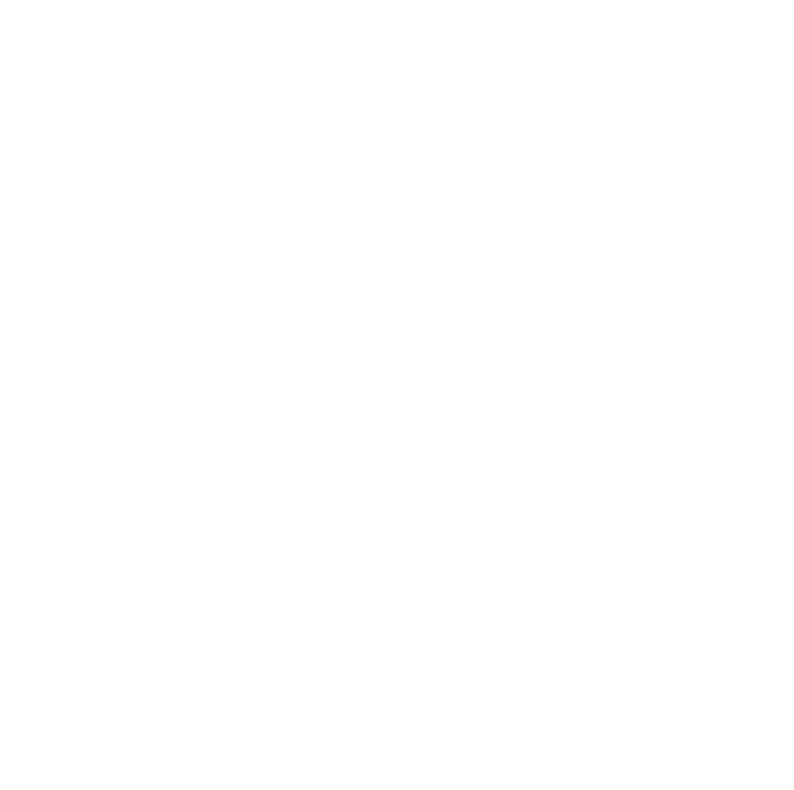

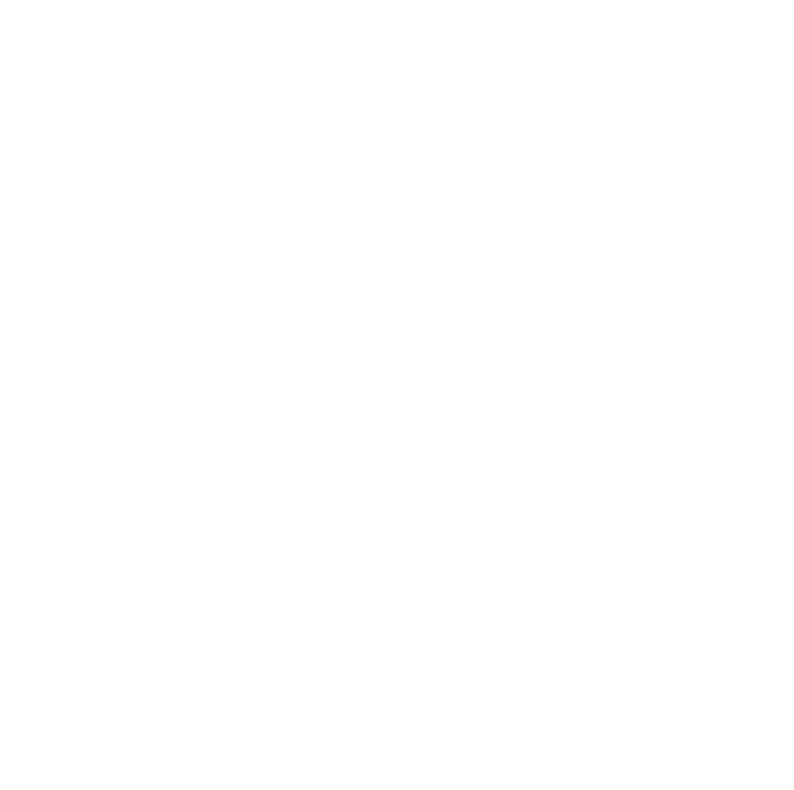

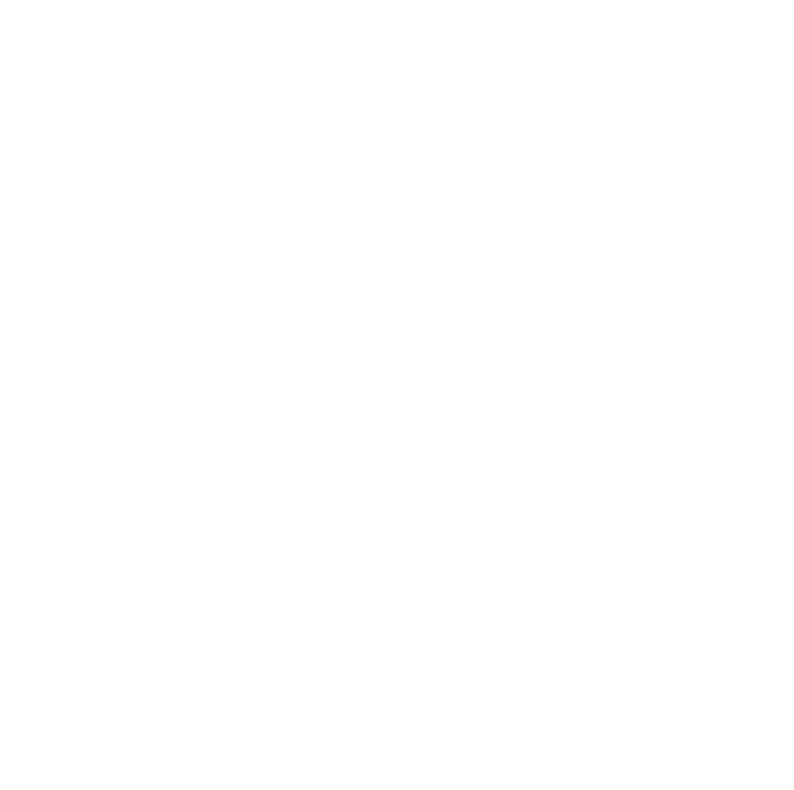

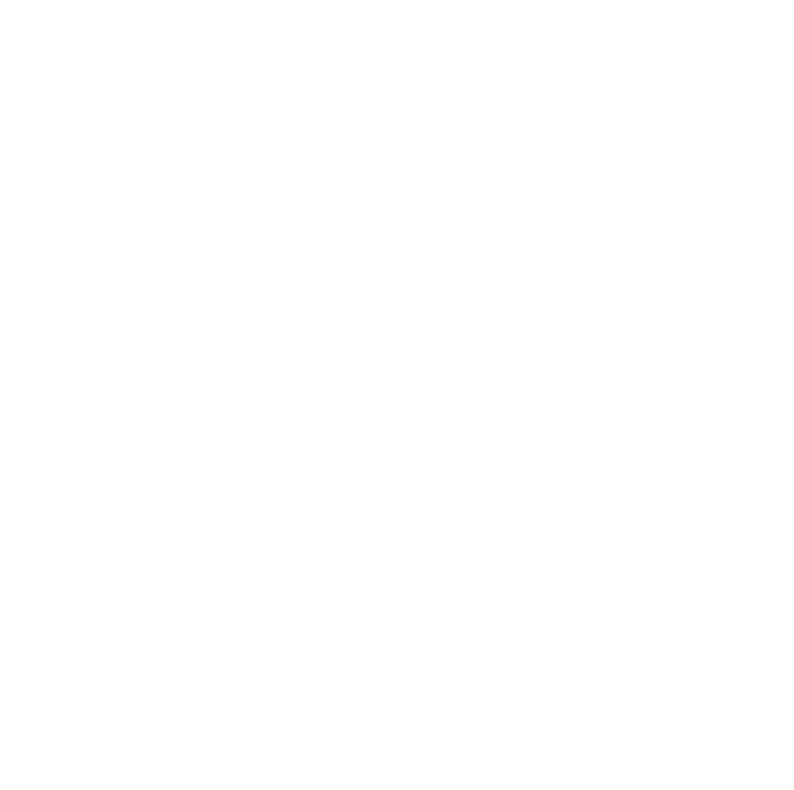

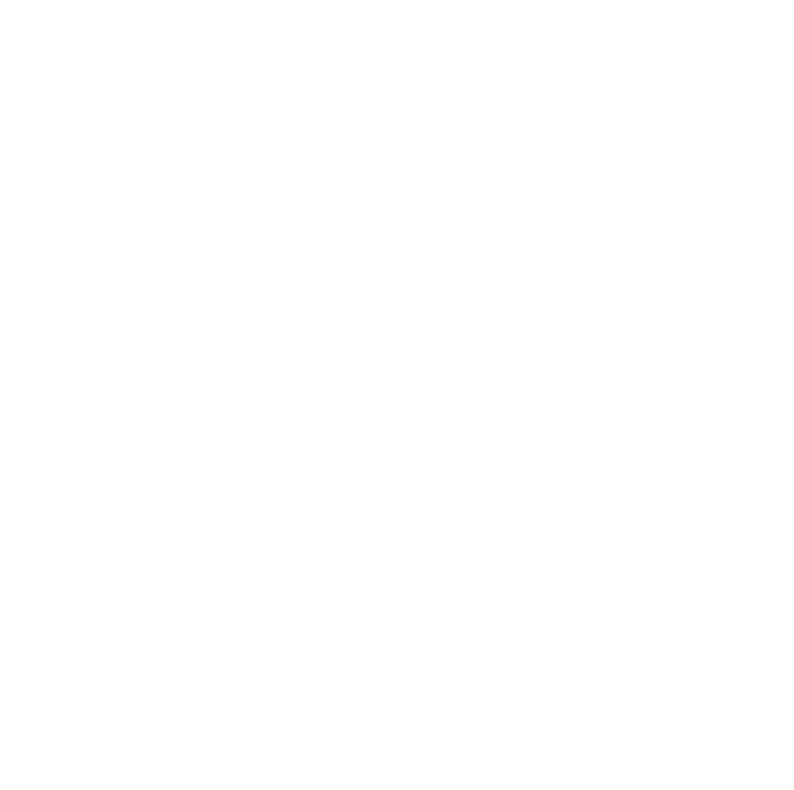

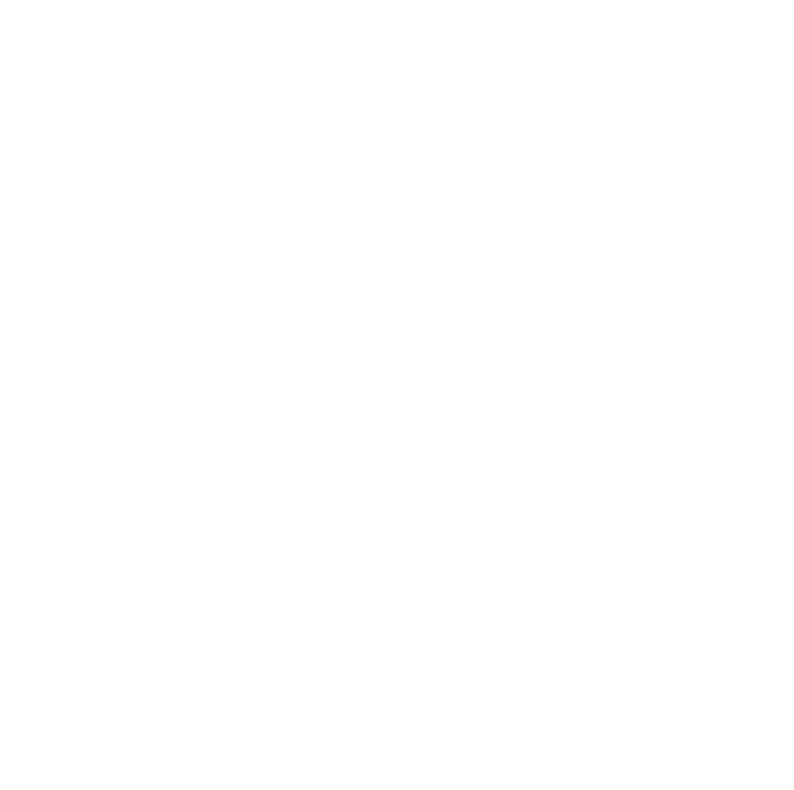

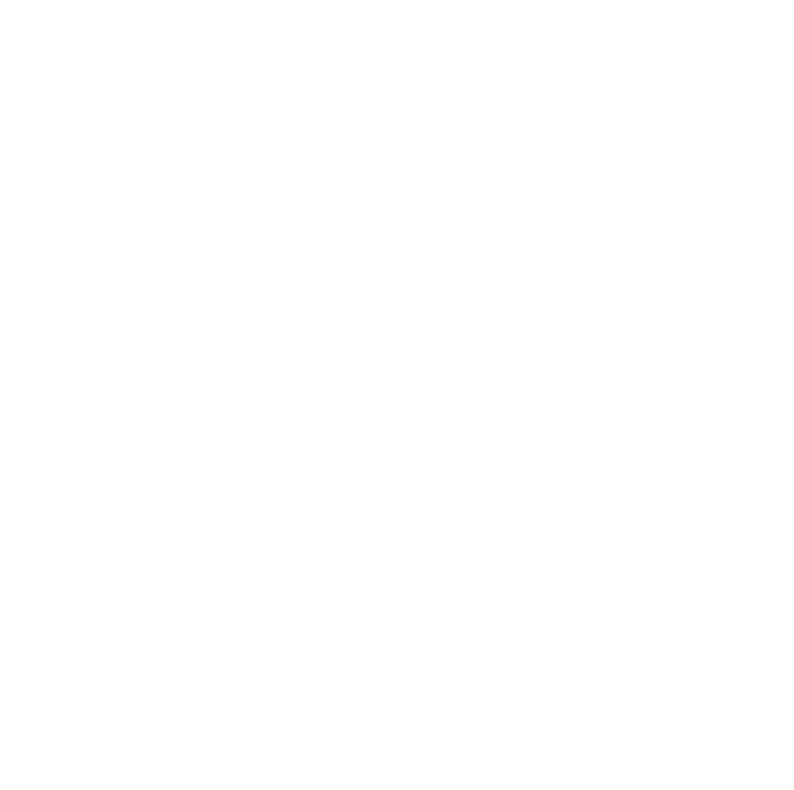

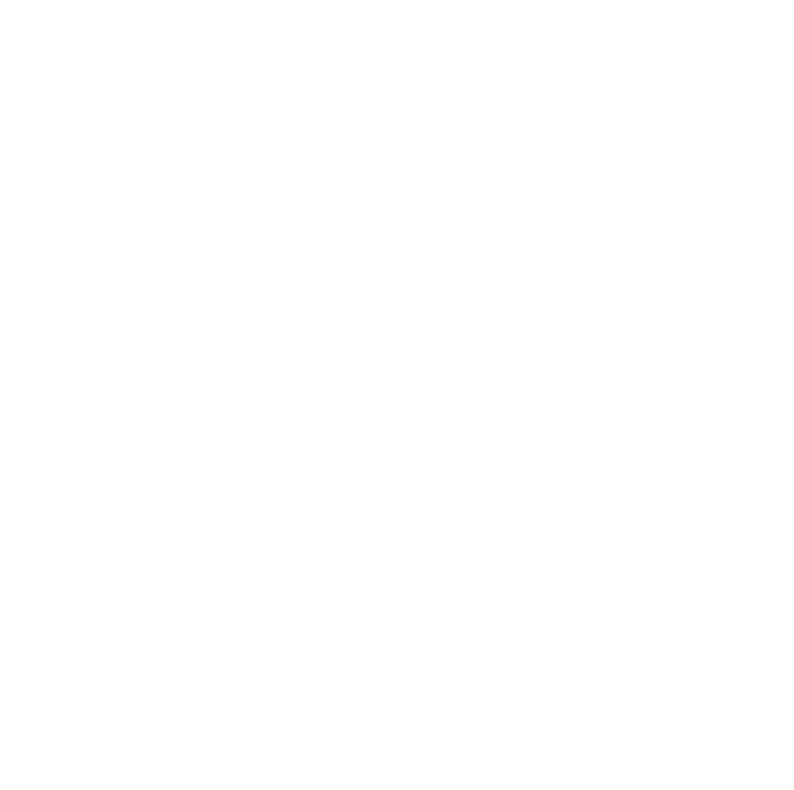

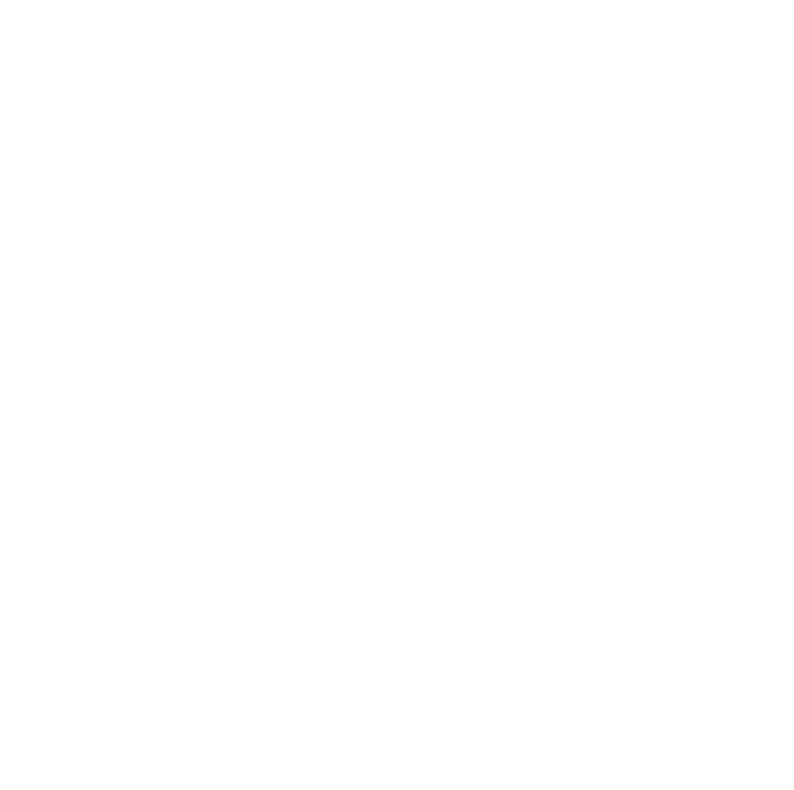

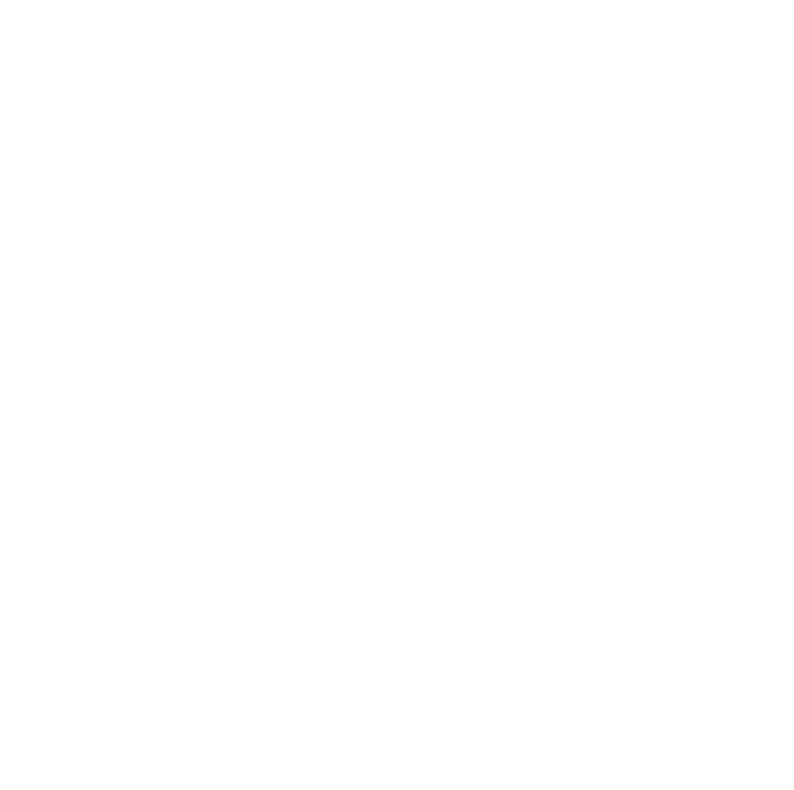

In [ ]:
import mmcv
from mmdet.apis import init_detector, inference_detector
from mmengine.visualization import Visualizer
import skimage.io

# Test data
output_data_dir = '/content/gdrive/MyDrive/cell_nuclei_data/output'
path_test_images = Path(cfg.data_root) / "images"
print(path_test_images)

with open(os.path.join(cfg.data_root, 'test.json')) as json_file:
    test_images_dict = json.load(json_file)

images_names = []
image_IDs_dict = {}
for dict_image in test_images_dict['images']:
    images_names.append(dict_image['file_name'])
    image_IDs_dict[dict_image['file_name']] = dict_image['id']

images_pairs_final = []

# print(images_names)
# print(image_IDs_dict)

filelist = [file for file in path_test_images.glob('*.jpg') if file.name in images_names]
print(filelist)

# Checkpoint file (finetunned model)
checkpoint_file = '/content/gdrive/MyDrive/cell_nuclei_data/COCO_cell_nuclei/tutorial_exps/mask-rcnn_r50-caffe_fpn_ms-poly-3x_coco_augmentations/epoch_100.pth'
print(os.path.exists(checkpoint_file))

for img_fn in random.choices(filelist, k=10):
    image_name = os.path.basename(img_fn)
    image_ID = image_IDs_dict[image_name]

    img = mmcv.imread(img_fn, channel_order='rgb')

    model = init_detector(cfg, checkpoint_file, device=get_device())
    result = inference_detector(model, img)
    # result_keys = result.keys()
    # print(type(result_keys))

    visualizer = Visualizer.get_current_instance()
    visualizer.dataset_meta = model.dataset_meta

    visualizer.add_datasample(
        'Predicted Objects',
        img,
        data_sample=result,
        draw_gt=False,
        wait_time=0,
        out_file=os.path.join(output_data_dir, f"pred_{img_fn.stem}.jpg"),
        # out_file = None,
    )

    visualizer.show()

    img_ground_truth = get_image_ground_truth(img_fn, image_ID)

    res_img = skimage.io.imread(os.path.join(output_data_dir, f"pred_{img_fn.stem}.jpg"))
    pair_GT_result = (img_ground_truth, res_img)

    images_pairs_final.append(pair_GT_result)
    # print(visualizer.show())

## Plotting results

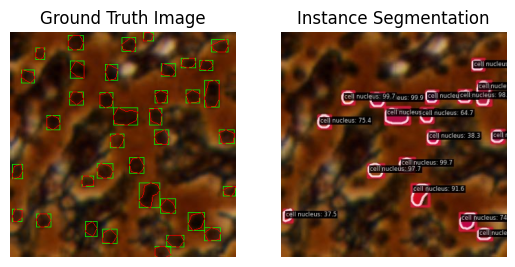

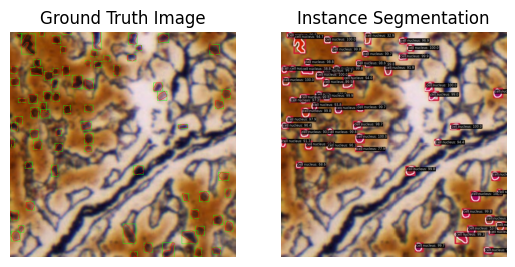

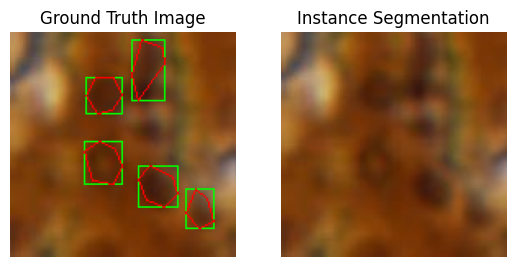

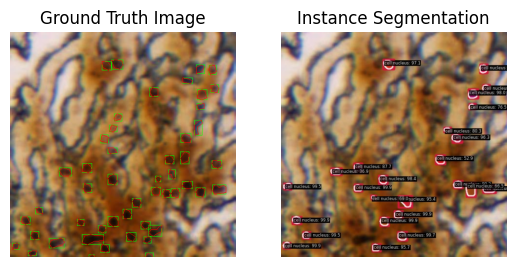

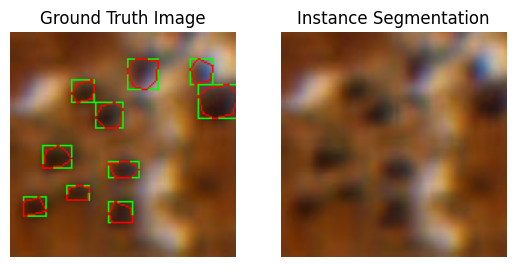

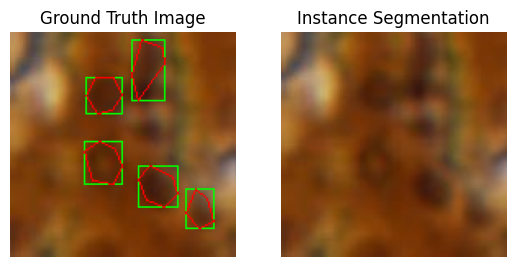

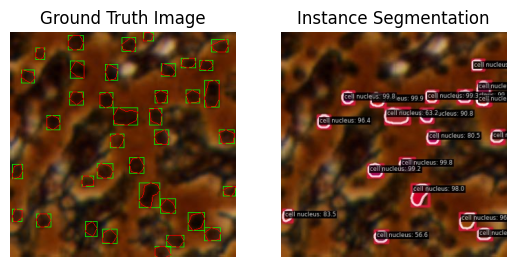

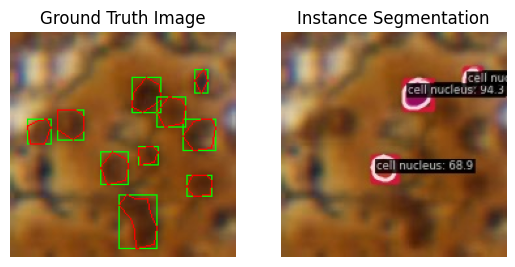

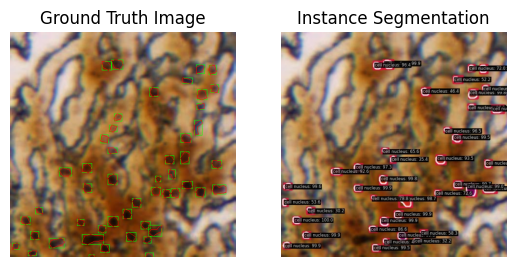

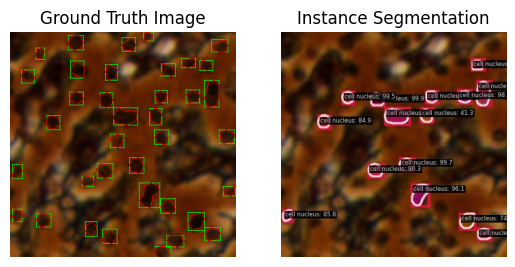

In [ ]:
for image_pair in images_pairs_final:
  # Plot the loaded_image
  plt.subplot(1, 2, 1)
  # plt.imshow(image_pair[0])
  plt.imshow(cv2.cvtColor(image_pair[0], cv2.COLOR_BGR2RGB))
  plt.title('Ground Truth Image')
  plt.axis('off')

  # Plot the img_ground_truth
  plt.subplot(1, 2, 2)
  plt.imshow(image_pair[1])
  plt.title('Instance Segmentation')
  plt.axis('off')

  plt.show()